In [1]:
import networkx as nx
import random
import ba_utils.visualization as visualization
import ba_utils.orderings as orderings
import ba_utils.network_rugs as nrugs
import ba_utils.data_generator as dg

In [2]:
def generate_dynamic_graphs(
    num_nodes=30,
    num_steps=10,
    num_groups=1,
    change_rate=0,
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    seed=42
):
    """
    Generate dynamic graphs with evolving group structures and guaranteed connectedness.

    Parameters:
        num_nodes (int): Total number of nodes.
        num_steps (int): Number of time steps (snapshots).
        num_groups (int): Number of initial communities.
        change_rate (float): Fraction of nodes changing group per step.
        intra_community_strength (float): Probability of edge within a community (0 to 1).
        inter_community_strength (float): Probability of edge between communities (0 to 1).
        seed (int): Random seed for reproducibility.

    Returns:
        graphs (dict): timestep → nx.Graph
        ground_truth (dict): timestep → {node: group}
        change_log (dict): timestep → list of changed node IDs
    """
    random.seed(seed)
    nodes = list(range(num_nodes))
    community_assignment = {node: node % num_groups for node in nodes}

    graphs = {}
    ground_truth = {}
    change_log = {}

    for t in range(num_steps):
        G = nx.Graph()
        G.add_nodes_from(nodes)

        # Add intra- and inter-community edges
        for i in range(num_nodes):
            for j in range(i+1, num_nodes):
                same_group = community_assignment[i] == community_assignment[j]
                p = intra_community_strength if same_group else inter_community_strength
                if random.random() < p:
                    G.add_edge(i, j, weight=1.0 if same_group else 0.3)

        # Force minimal connectivity between communities
        community_nodes = {g: [] for g in range(num_groups)}
        for node, group in community_assignment.items():
            community_nodes[group].append(node)

        sorted_communities = sorted(community_nodes.keys())
        for i in range(len(sorted_communities) - 1):
            node_a = random.choice(community_nodes[sorted_communities[i]])
            node_b = random.choice(community_nodes[sorted_communities[i + 1]])
            G.add_edge(node_a, node_b, weight=0.01)  # Very weak connecting edge

        # Store current graph and group structure
        graphs[t] = G
        ground_truth[t] = community_assignment.copy()

        # Track community changes (from previous timestep)
        if t > 0:
            prev_assignment = ground_truth[t-1]
            changed_nodes = [
                node for node in nodes
                if community_assignment[node] != prev_assignment[node]
            ]
            change_log[t] = changed_nodes

        # Evolve group membership
        num_changes = int(change_rate * num_nodes)
        for _ in range(num_changes):
            node = random.choice(nodes)
            current_group = community_assignment[node]
            new_group = random.choice([g for g in range(num_groups) if g != current_group])
            community_assignment[node] = new_group

    return graphs, ground_truth, change_log

num_artists 25
num_artists 25
pixelsize updated to: 32
min_centrality_all: 0.7366482504604052 max_centrality_all: 1.5209125475285172
centrality for 0 at timestamp 0 is:  0.9408075264602116
centrality for 2 at timestamp 0 is:  1.0037641154328734
centrality for 4 at timestamp 0 is:  1.24031007751938
centrality for 6 at timestamp 0 is:  0.971266693646297
centrality for 8 at timestamp 0 is:  0.971266693646297
centrality for 10 at timestamp 0 is:  1.0475774770842428
centrality for 12 at timestamp 0 is:  1.0661928031985783
centrality for 14 at timestamp 0 is:  0.8353637312913331
centrality for 16 at timestamp 0 is:  0.8353637312913331
centrality for 18 at timestamp 0 is:  0.8353637312913331
centrality for 20 at timestamp 0 is:  1.0661928031985786
centrality for 22 at timestamp 0 is:  1.21765601217656
centrality for 24 at timestamp 0 is:  0.9122006841505131
centrality for 3 at timestamp 0 is:  0.9019165727170237
centrality for 1 at timestamp 0 is:  1.1315417256011315
centrality for 5 at times

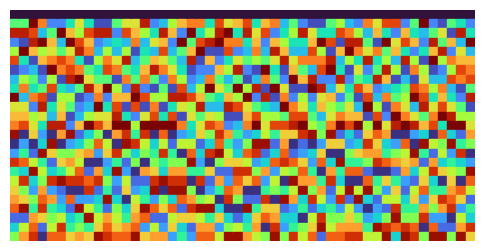

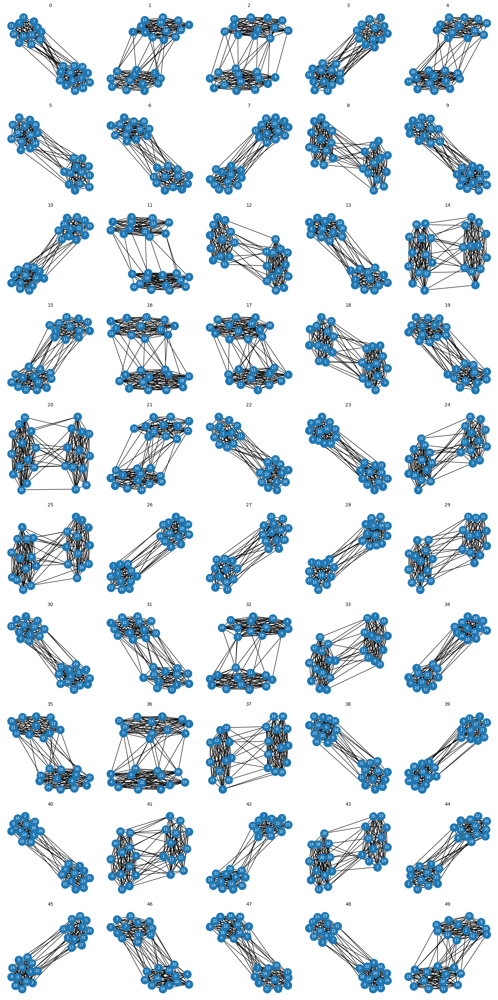

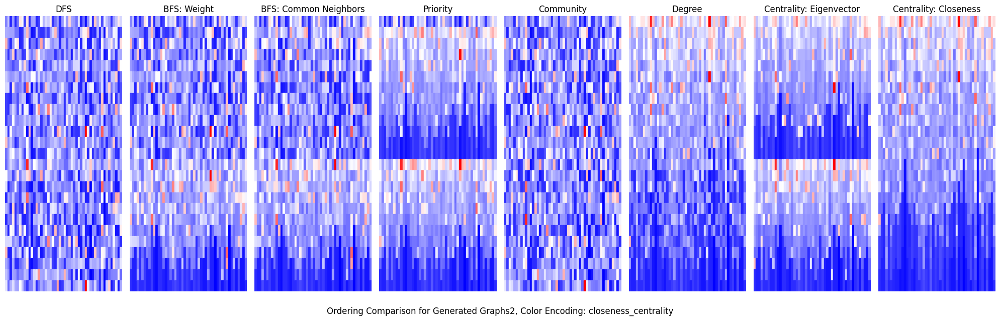

In [3]:
simple, gt, cl = generate_dynamic_graphs(num_nodes=25, num_steps=50, num_groups=2)
nrugs.draw_networkrug(simple, color_encoding="id3", pixel_size=12),
visualization.visualize_graphs(simple)

fig = visualization.draw_all_colored(simple, title="Generated Graphs2", save=False, color_encoding="closeness_centrality", labels=False)
print(gt)

#if change_rate > 0:
#    print("Change log:")
#for t in cl:
#    print(f"Step {t}: {len(cl[t])} nodes changed — {cl[t]}")

num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 15
num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 15
num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 15
num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 15
num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 15
num_artists 16
pixelsize updated to: 56
min_centrality_all: 0.36127167630057805 max_centrality_all: 1.910828025477707
id_mapper: colormap created with bwr and 0 to 1

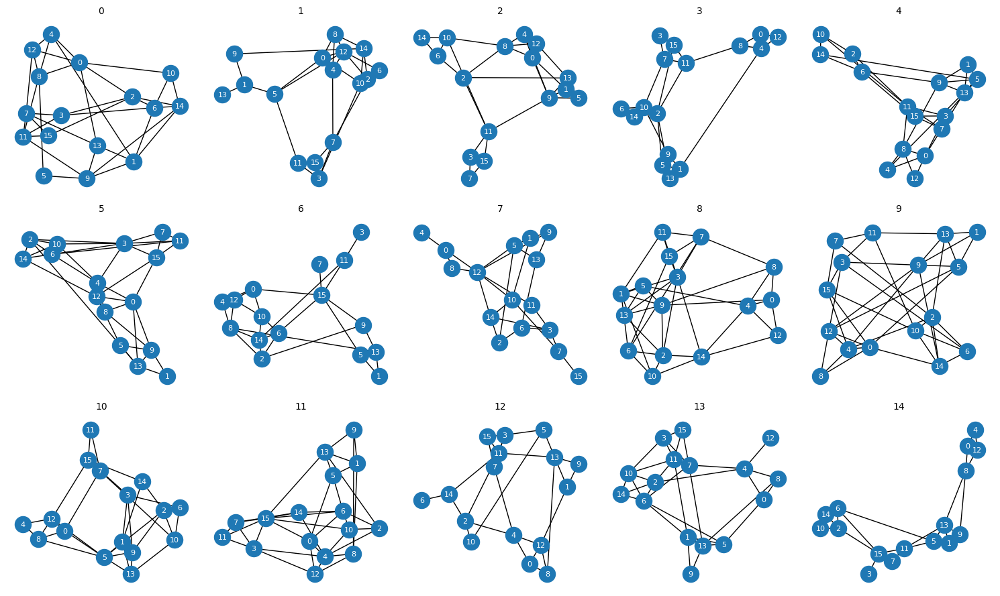

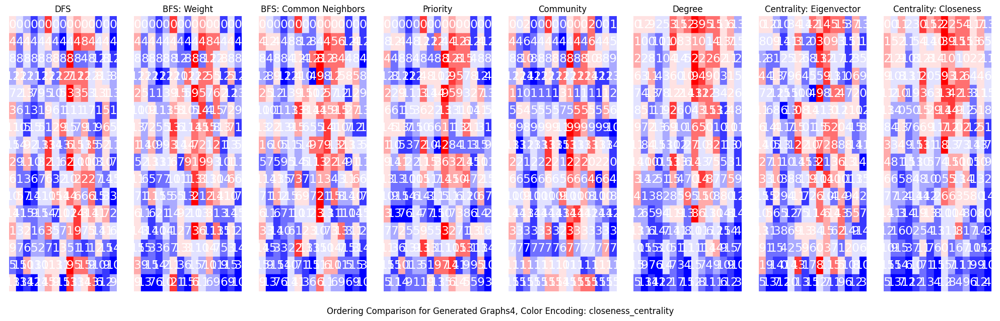

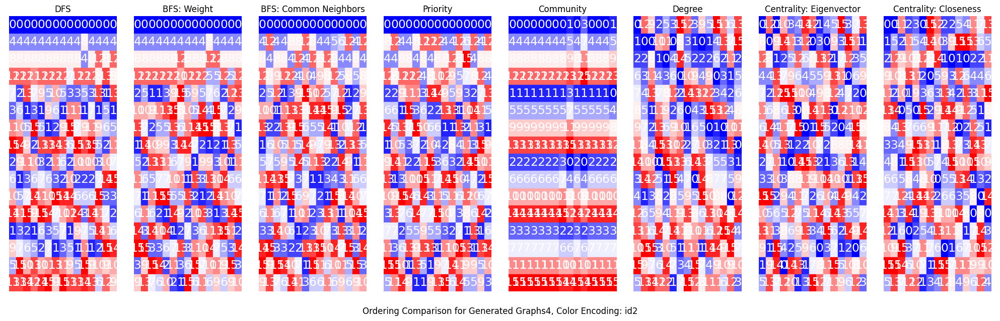

In [7]:
graphs4, gt, changes = generate_dynamic_graphs(num_nodes=16, num_steps=15, num_groups=4, change_rate=0.01, intra_community_strength=0.8, inter_community_strength=0.1)

visualization.visualize_graphs(graphs4)

fig = visualization.draw_all_colored(graphs4, title="Generated Graphs4", save=False, color_encoding="closeness_centrality", labels=True)
fig2 = visualization.draw_all_colored(graphs4, title="Generated Graphs4", save=False, color_encoding="id2", labels=True)
print(gt)


num_artists 70
min_centrality_all: 0.0 max_centrality_all: 0.17747215486985307


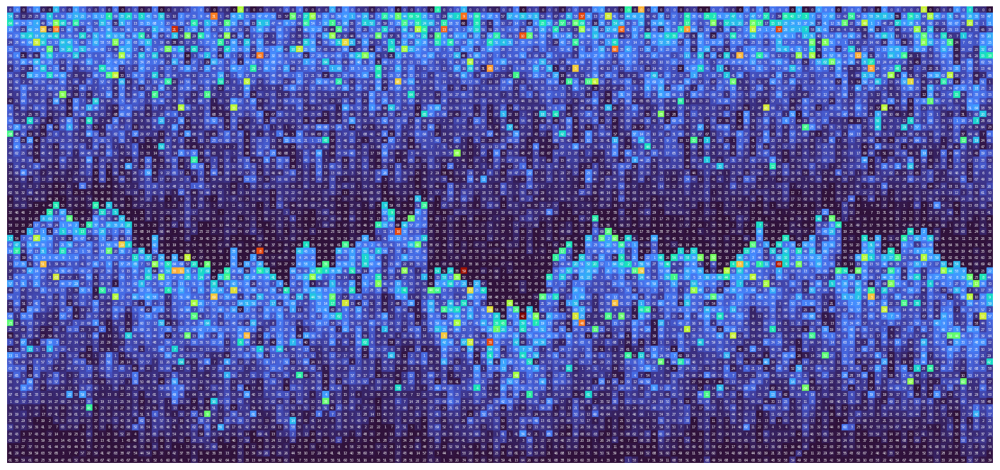

In [4]:
graphs_2, gt, cl = generate_dynamic_graphs(num_nodes=70, num_steps=150, num_groups=2, change_rate=0.05)
nrugs.draw_networkrug(graphs_2, color_encoding="betweenness_centrality", labels=True, pixel_size=12)

In [ ]:
graphs_2, gt, cl = generate_dynamic_graphs(num_nodes=25, num_steps=150, num_groups=4, change_rate=0.05)
nrugs.draw_networkrug(graphs_2, color_encoding="betweenness_centrality", labels=True, pixel_size=12)

#### One group splitting into two groups

[t=10] New group created from split: 1
num_artists 30
min_centrality_all: 0.232 max_centrality_all: 0.4142857142857143
centrality for 0 at timestamp 0 is:  0.3333333333333333
centrality for 1 at timestamp 0 is:  0.3333333333333333
centrality for 2 at timestamp 0 is:  0.3333333333333333
centrality for 3 at timestamp 0 is:  0.3333333333333333
centrality for 4 at timestamp 0 is:  0.3333333333333333
centrality for 5 at timestamp 0 is:  0.3333333333333333
centrality for 6 at timestamp 0 is:  0.3333333333333333
centrality for 7 at timestamp 0 is:  0.3333333333333333
centrality for 8 at timestamp 0 is:  0.3333333333333333
centrality for 9 at timestamp 0 is:  0.3333333333333333
centrality for 10 at timestamp 0 is:  0.3333333333333333
centrality for 11 at timestamp 0 is:  0.3333333333333333
centrality for 12 at timestamp 0 is:  0.3333333333333333
centrality for 13 at timestamp 0 is:  0.3333333333333333
centrality for 14 at timestamp 0 is:  0.3333333333333333
centrality for 15 at timestamp 0 is:

<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

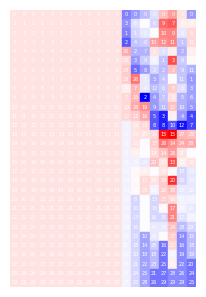

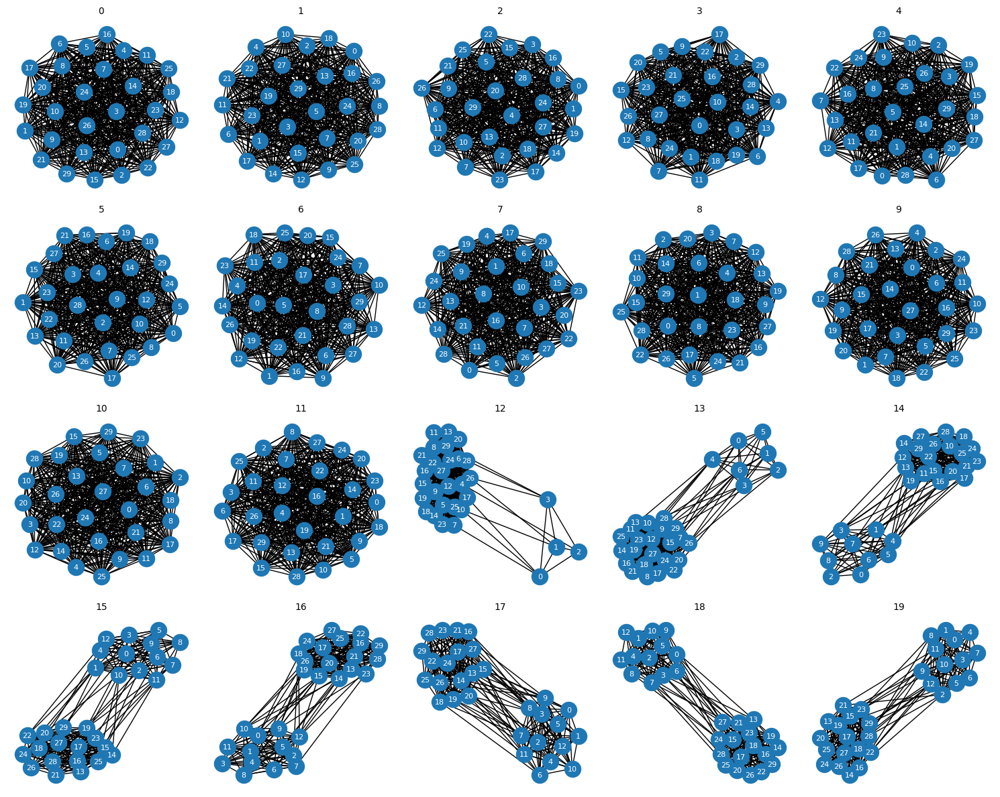

In [4]:
graphsXX, gt, cl = dg.generate_dynamic_graphs(
    num_nodes=30,
    num_steps=20,
    initial_groups=1,
    change_rate=0.00,
    intra_community_strength=1,
    inter_community_strength=0.1,
    split_events= {10: [(0, 5)] },
    seed=123
)
nrugs.draw_networkrug(graphsXX, color_encoding="closeness_centrality", colormap="bwr", labels=True, pixel_size=12, init_start=False)
visualization.visualize_graphs(graphsXX)

#### Two groups, one stays the same, one splits into two groups so in the end we have three groups

[t=10] New group created from split: 2
[t=15] New group created from split: 3
num_artists 120


<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

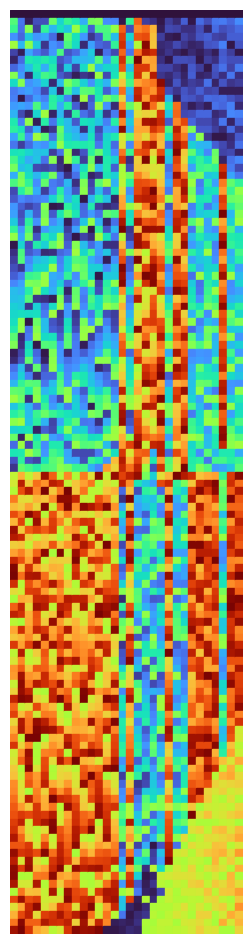

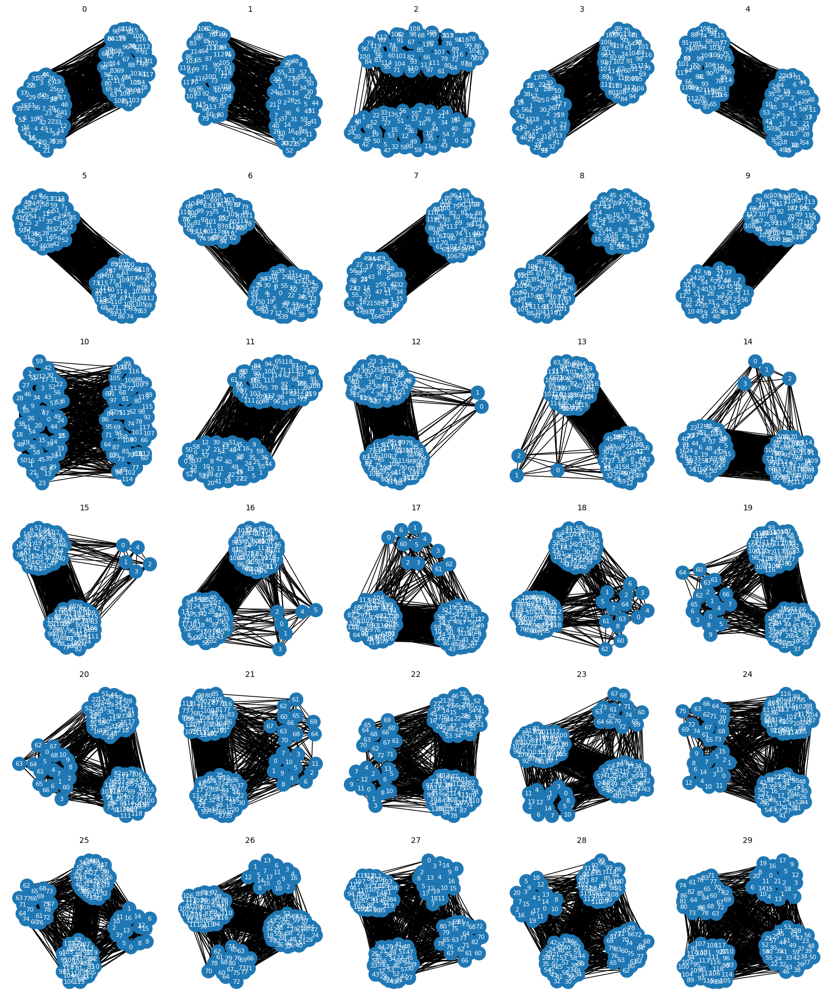

In [5]:
graphs, gt, changes = dg.generate_dynamic_graphs(
    num_nodes=120,
    num_steps= 30,
    initial_groups=2,
    change_rate=0,
    intra_community_strength=1,
    inter_community_strength=0.1,
    split_events= {10: [(0, 25)], 15: [(1, 15)]},
    #init_mode="random",
    init_mode="block",
    seed=42
)
nrugs.draw_networkrug(graphs, color_encoding="id", order="", labels=False, pixel_size=10, init_start=False)
visualization.visualize_graphs(graphs)

#nrugs.interactive_rug(graphs)   

num_artists 12
id_mapper: colormap created with turbo and 0 to 11


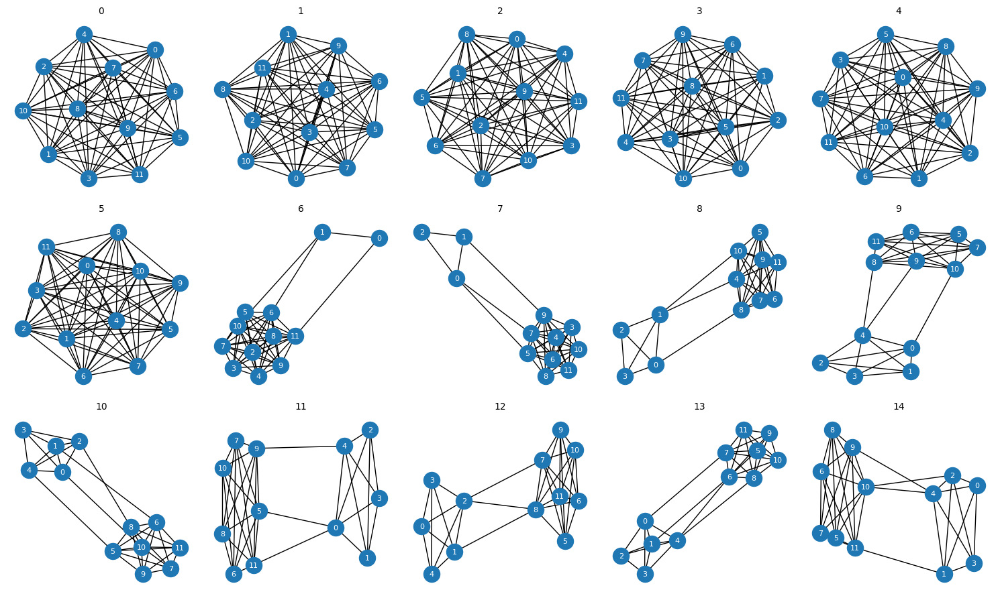

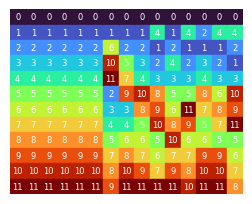

In [15]:
graphs, gt, changes = dg.generate_dynamic_graphs(
    num_nodes=12,
    num_steps= 15,
    initial_groups=1,
    change_rate=0,
    intra_community_strength=1,
    inter_community_strength=0.1,
    split_events={4: [(0, 5)]},
    seed=42
)
visualization.visualize_graphs(graphs)
nrugs.draw_networkrug(graphs, color_encoding="id3", labels=True, pixel_size=20)

### Large number of time steps, one group splitting into two groups


In [5]:
graphs, gt, changes = dg.generate_dynamic_graphs(
    num_nodes=50,
    num_steps= 300,
    initial_groups=1,
    change_rate=0,
    intra_community_strength=0.9,
    inter_community_strength=0.1,
    split_events={125: [(0, 100)]},
    seed=42
)

#visualization.visualize_graphs(graphs)

num_artists 120
num_artists 120
min_centrality_all: 0.2748267898383372 max_centrality_all: 0.497907949790795


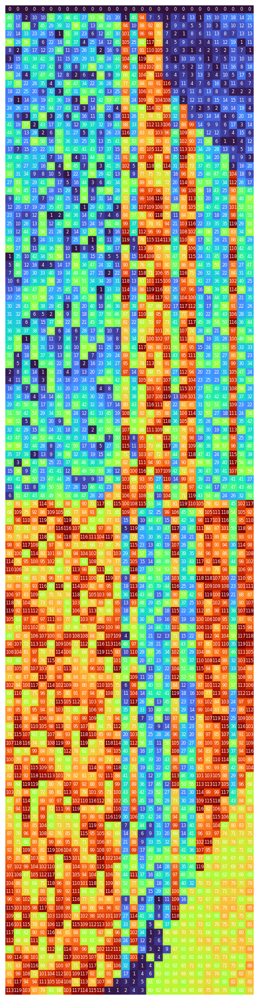

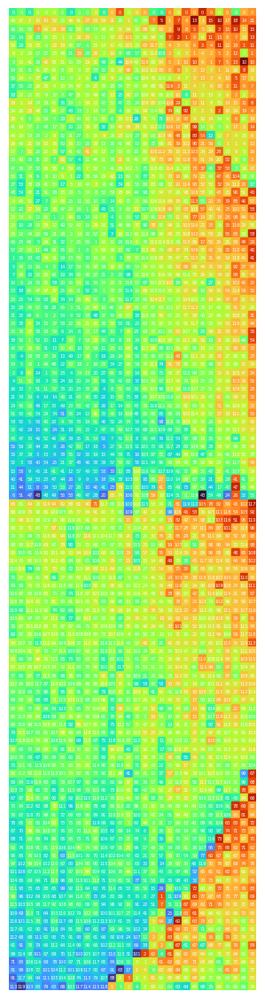

In [7]:
nrugs.draw_networkrug(graphs, color_encoding="id3", labels=True, pixel_size=20)
nrugs.draw_networkrug(graphs, color_encoding="closeness_centrality", labels=True, pixel_size=12)

num_artists 12
id_mapper: colormap created with turbo and 0 to 11


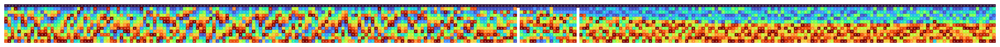

In [7]:
graphs, gt, changes = dg.generate_dynamic_graphs(
    num_nodes= 12,
    num_steps= 300,
    initial_groups=1,
    change_rate=0,
    intra_community_strength=0.9,
    inter_community_strength=0.1,
    split_events={125: [(0, 100)]},
    seed=42
)
nrugs.draw_networkrug(graphs, color_encoding="id3", labels=True, pixel_size=10)

num_artists 10
min_centrality_all: 0.0 max_centrality_all: 0.5833333333333333
id_mapper: colormap created with turbo and 0 to 9
num_artists 10
min_centrality_all: 0.14516129032258066 max_centrality_all: 0.4090909090909091
id_mapper: colormap created with turbo and 0 to 9


<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

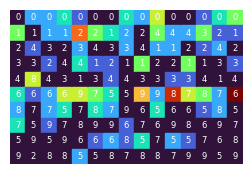

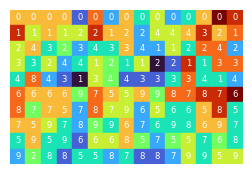

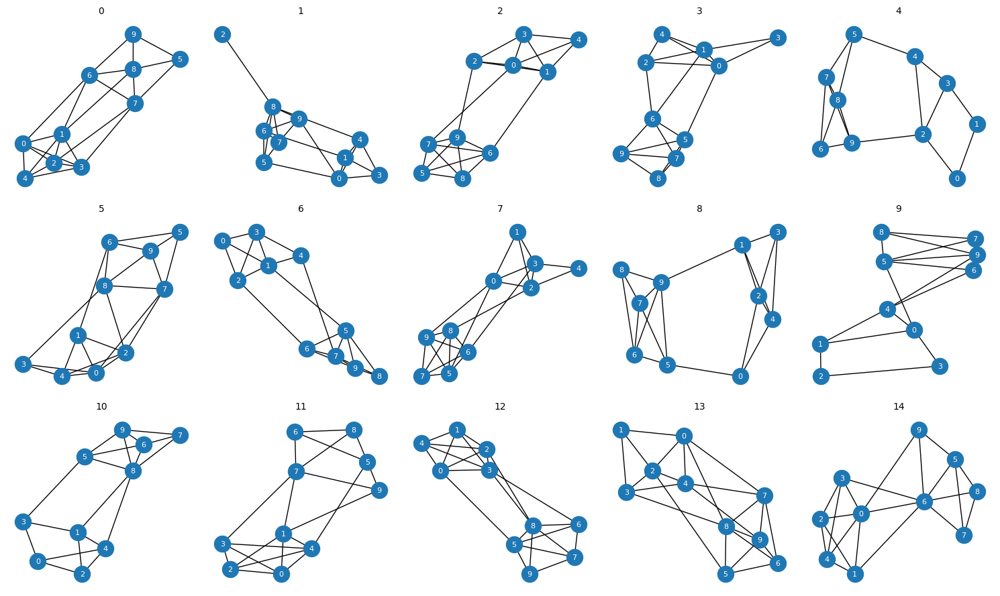

In [8]:
large_graphs, gt2_4, changes2_4 = dg.generate_dynamic_graphs(
    num_nodes=10,
    num_steps=15,
    initial_groups=2,
    change_rate=0,
    intra_community_strength=0.8,
    inter_community_strength=0.1,
    split_events={},  # {} not the same as None
    seed=123
)
nrugs.draw_networkrug(large_graphs, color_encoding="betweenness_centrality", labels=True, pixel_size=20)
nrugs.draw_networkrug(large_graphs, color_encoding="closeness_centrality", labels=True, pixel_size=20)

visualization.visualize_graphs(large_graphs)

#### Development of Merge Generation Function

merge event is specified as a tuple (src, dst, duration), meaning “gradually merge the source group src into the destination group dst over the given duration

In [17]:
def generate_dynamic_graphs(
    num_nodes=30,
    num_steps=10,
    num_groups=1,
    change_rate=0,
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    split_events=None,
    merge_events=None,
    split_fraction=0.5,
    merge_fraction=1.0,
    seed=42
):
    """
    Generate dynamic graphs with evolving group structures and scheduled partial split and merge events.
    
    Parameters:
        num_nodes (int): Total number of nodes.
        num_steps (int): Number of timesteps (snapshots).
        num_groups (int): Initial number of communities.
        change_rate (float): Fraction of nodes that change groups randomly each step.
        intra_community_strength (float): Probability of an edge within a community.
        inter_community_strength (float): Probability of an edge between communities.
        split_events (dict): { timestep: [(group_to_split, duration), ...] }
                             At a given timestep, a partial split is scheduled for the specified group.
        merge_events (dict): { timestep: [(src, dst, duration), ...] }
                             At a given timestep, a merge is scheduled to gradually move nodes from group src to group dst.
        split_fraction (float): Fraction of nodes to move during a split event.
        merge_fraction (float): Fraction of nodes to move during a merge event (default=1.0 means complete merge).
        seed (int): Random seed for reproducibility.
    
    Returns:
        graphs (dict): Mapping from timestep to NetworkX graph.
        ground_truth (dict): Mapping from timestep to {node: group_id}.
        change_log (dict): Mapping from timestep to list of node IDs that changed groups since the previous timestep.
    """
    random.seed(seed)
    nodes = list(range(num_nodes))
    # Initial round-robin assignment (if num_groups==1, all nodes start in group 0)
    community_assignment = {node: node % num_groups for node in nodes}
    
    # Track active groups (these are the group IDs available so far)
    active_groups = set(range(num_groups))
    
    graphs = {}
    ground_truth = {}
    change_log = {}
    
    # Ongoing partial split events:
    # Each entry is a dict: { "end_step": t_end, "remaining_nodes": [...], "old_group": g_old, "new_group": g_new }
    ongoing_splits = []
    # Ongoing partial merge events:
    # Each entry is a dict: { "end_step": t_end, "remaining_nodes": [...], "src": src, "dst": dst }
    ongoing_merges = []
    
    for t in range(num_steps):
        G = nx.Graph()
        G.add_nodes_from(nodes)
        
        # Build the graph edges based on current community_assignment.
        for i in range(num_nodes):
            for j in range(i+1, num_nodes):
                same_group = community_assignment[i] == community_assignment[j]
                p = intra_community_strength if same_group else inter_community_strength
                if random.random() < p:
                    # Use weight 1.0 for intra-group, 0.3 for inter-group
                    G.add_edge(i, j, weight=1.0 if same_group else 0.3)
        
        # Force minimal connectivity between communities (to help with visualization)
        # Here, we add a very weak edge between a randomly chosen node from each adjacent group.
        community_nodes = {}
        for group in set(community_assignment.values()):
            community_nodes[group] = [node for node, grp in community_assignment.items() if grp == group]
        sorted_groups = sorted(community_nodes.keys())
        for idx in range(len(sorted_groups)-1):
            node_a = random.choice(community_nodes[sorted_groups[idx]])
            node_b = random.choice(community_nodes[sorted_groups[idx+1]])
            G.add_edge(node_a, node_b, weight=0.01)
        
        # Record current graph and ground truth.
        graphs[t] = G
        ground_truth[t] = community_assignment.copy()
        if t > 0:
            prev_assignment = ground_truth[t-1]
            changed_nodes = [node for node in nodes if community_assignment[node] != prev_assignment[node]]
            change_log[t] = changed_nodes
        
        still_ongoing_merges = []
        for merge_info in ongoing_merges:
            if t < merge_info["start"]:
                still_ongoing_merges.append(merge_info)
                continue
            # calculated how many swapps
            elapsed = t - merge_info["start"]
            expected_moves = int(elapsed // merge_info["interval"]) + 1
            moves_to_do = expected_moves - merge_info["nodes_moved"]
            if moves_to_do > 0:
                num_available = len(merge_info["remaining_nodes"])
                num_to_move = min(moves_to_do, num_available)
                to_move = merge_info["remaining_nodes"][:num_to_move]
                merge_info["remaining_nodes"] = merge_info["remaining_nodes"][num_to_move:]
                for node in to_move:
                    community_assignment[node] = merge_info["dst"]
                merge_info["nodes_moved"] += num_to_move
            if t < merge_info["end_step"] and merge_info["remaining_nodes"]:
                still_ongoing_merges.append(merge_info)
            else:
                # Merge-Event ist zu Ende; falls keine Knoten mehr in der Quellgruppe sind, entferne sie.
                remaining_in_src = [n for n, g in community_assignment.items() if g == merge_info["src"]]
                if not remaining_in_src:
                    active_groups.discard(merge_info["src"])
        ongoing_merges = still_ongoing_merges
        
        # Process ongoing split events with fixed interval.
        still_ongoing_splits = []
        for split_info in ongoing_splits:
            if t < split_info["end_step"]:
                elapsed = t - split_info["start"]
                expected_moves = int(elapsed // split_info["interval"]) + 1
                moves_to_do = expected_moves - split_info["nodes_moved"]
                if moves_to_do > 0:
                    num_remaining = len(split_info["remaining_nodes"])
                    num_to_move = min(moves_to_do, num_remaining)
                    # Move the next num_to_move nodes evenly.
                    to_move = split_info["remaining_nodes"][:num_to_move]  # slice: Get the first num_to_move elements
                    split_info["remaining_nodes"] = split_info["remaining_nodes"][num_to_move:]
                    for node in to_move:
                        community_assignment[node] = split_info["new_group"]
                    split_info["nodes_moved"] += num_to_move
                if t < split_info["end_step"] and split_info["remaining_nodes"]:
                    still_ongoing_splits.append(split_info)
        ongoing_splits = still_ongoing_splits
        
        # Check for new split events at this timestep.
        if split_events and t in split_events:
            for (group_to_split, duration) in split_events[t]:
                nodes_in_group = [n for n, g in community_assignment.items() if g == group_to_split]
                if len(nodes_in_group) >= 2:
                    split_size = int(len(nodes_in_group) * split_fraction)
                    # Berechne das Intervall zwischen den Verschiebungen, sodass der Split gleichmäßig erfolgt.
                    split_interval = duration / split_size if split_size > 0 else duration
                    new_group_id = max(active_groups) + 1
                    active_groups.add(new_group_id)
                    end_step = t + duration
                    nodes_to_move = random.sample(nodes_in_group, split_size)
                    ongoing_splits.append({
                        "start": t,                   # Split startet sofort bei split_time
                        "end_step": end_step,         # Split endet nach der vollen Duration
                        "remaining_nodes": nodes_to_move,
                        "old_group": group_to_split,
                        "new_group": new_group_id,
                        "interval": split_interval,   # Zeitintervall zwischen Verschiebungen
                        "nodes_moved": 0              # Anzahl bereits verschobener Knoten
                    })
                    
        # Check for new merge events at this timestep.
        if merge_events and t in merge_events:
            for (src, dst, duration) in merge_events[t]:
                nodes_in_src = [n for n, g in community_assignment.items() if g == src]
                if len(nodes_in_src) >= 1:
                    merge_size = int(len(nodes_in_src) * merge_fraction)
                    # Berechne das Intervall zwischen den Verschiebungen, sodass die Verschiebung gleichmäßig erfolgt.
                    merge_interval = duration / merge_size if merge_size > 0 else duration
                    effective_start = t  # Merge beginnt sofort bei merge_time
                    effective_end = t + duration
                    nodes_to_move = random.sample(nodes_in_src, merge_size)
                    ongoing_merges.append({
                        "start": effective_start,      # Merge startet sofort bei merge_time
                        "end_step": effective_end,       # Merge endet nach der vollen Duration
                        "remaining_nodes": nodes_to_move,
                        "src": src,
                        "dst": dst,
                        "interval": merge_interval,     # Intervall zwischen Verschiebungen
                        "nodes_moved": 0                # Zähler für bereits verschobene Knoten
                    })
        
        # Process normal random evolution (if any).
        num_changes = int(change_rate * num_nodes)
        for _ in range(num_changes):
            node = random.choice(nodes)
            current_group = community_assignment[node]
            other_groups = [g for g in active_groups if g != current_group]
            if other_groups:
                new_group = random.choice(other_groups)
                community_assignment[node] = new_group
    
    return graphs, ground_truth, change_log


def generate_split_merge_data(
    num_nodes=30,
    num_steps=15,
    initial_groups=1,
    split_time=None,
    split_duration=10,
    merge_time=None,
    merge_duration=10,
    split_fraction=0.5,
    merge_fraction=1.0,
    intra_community_strength=0.8,
    inter_community_strength=0.05,
    seed=42
):
    """
    Generate dynamic graphs demonstrating a split event followed by a merge event.
    
    Parameters:
        num_nodes (int): Total number of nodes.
        num_steps (int): Total number of timesteps.
        initial_groups (int): Initial number of groups (for a split demo, set to 1).
        split_time (int): Timestep when the split is triggered
        split_duration (int): Duration over which to perform the split gradually.
        merge_time (int): Timestep when the merge is triggered
        merge_duration (int): Duration over which to perform the merge gradually.
        split_fraction (float): Fraction of nodes in the splitting group to move.
        merge_fraction (float): Fraction of nodes in the source group to merge (default 1.0 means complete merge).
        intra_community_strength (float): Edge probability within communities.
        inter_community_strength (float): Edge probability between communities.
        seed (int): Random seed.
        
    Returns:
        graphs, ground_truth, change_log from generate_dynamic_graphs.
    """
    # Disable additional random evolution for demonstration.
    change_rate = 0
    if split_time is None:
        split_events = {}
    if merge_time is None:
        merge_events = {}
    
    # Setup split events: trigger a split on group 0 at split_time over split_duration timesteps.
    split_events = { split_time: [(0, split_duration)] }
    # Setup merge events: trigger a merge that gradually moves nodes from the new group (assumed to be group 1)
    # into group 0 at merge_time over merge_duration timesteps.
    merge_events = { merge_time: [(1, 0, merge_duration)] }
    
    return generate_dynamic_graphs(
        num_nodes=num_nodes,
        num_steps=num_steps,
        num_groups=initial_groups,
        change_rate=change_rate,
        intra_community_strength=intra_community_strength,
        inter_community_strength=inter_community_strength,
        split_events=split_events,
        merge_events=merge_events,
        split_fraction=split_fraction,
        merge_fraction=merge_fraction,
        seed=seed
    )


<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

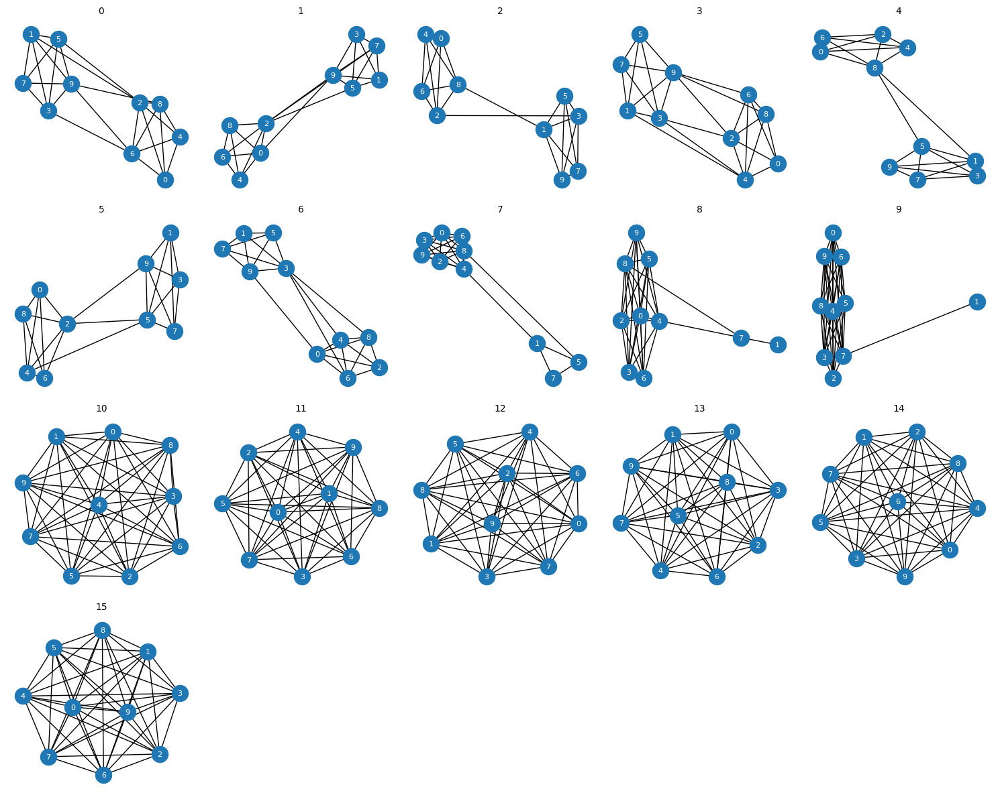

In [18]:
graphs5, gt, changes = generate_split_merge_data(
    num_nodes=10,
    num_steps=16,
    initial_groups=2,
    merge_time=5,
    merge_duration=5,
    intra_community_strength=1,
    inter_community_strength=0.1
)
#nrugs.draw_networkrug(graphs5, color_encoding="id3", labels=True, pixel_size=20)

visualization.visualize_graphs(graphs5)

<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

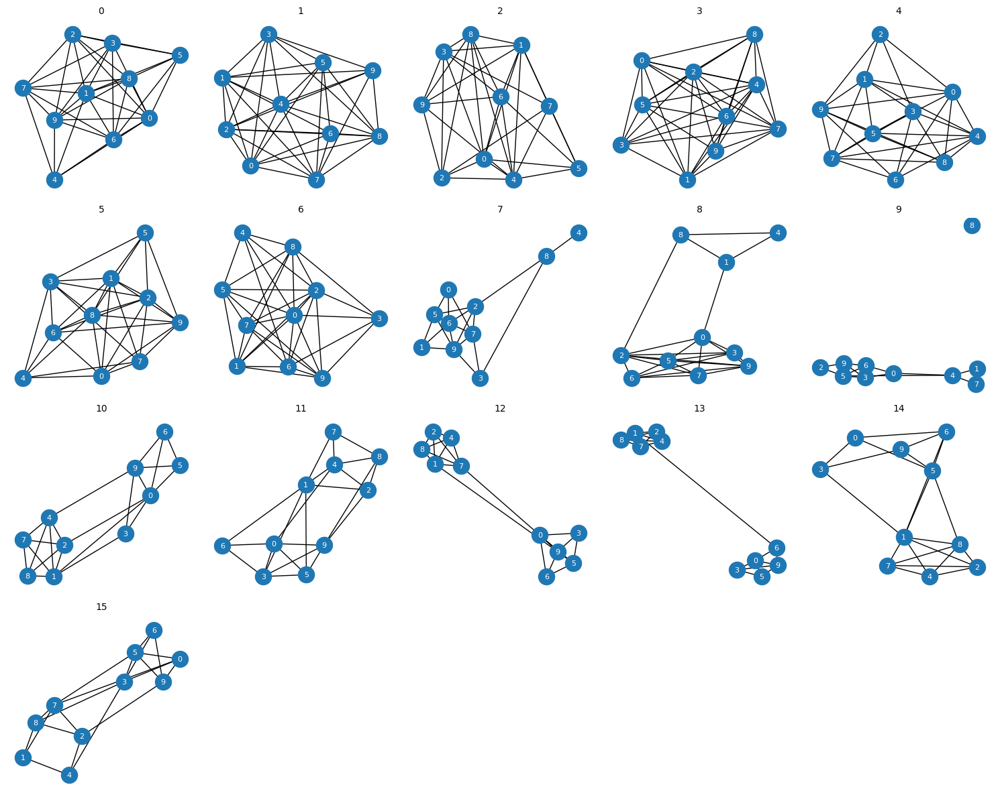

In [19]:
graphs5, gt, changes = generate_split_merge_data(
    num_nodes=10,
    num_steps=16,
    initial_groups=1,
    split_time=5,
    split_duration=5,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
#nrugs.draw_networkrug(graphs5, color_encoding="id3", labels=True, pixel_size=20)

visualization.visualize_graphs(graphs5)

Step 1: 0 nodes changed — []
Step 2: 0 nodes changed — []
Step 3: 0 nodes changed — []
Step 4: 0 nodes changed — []
Step 5: 0 nodes changed — []
Step 6: 0 nodes changed — []
Step 7: 0 nodes changed — []
Step 8: 0 nodes changed — []
Step 9: 0 nodes changed — []
Step 10: 0 nodes changed — []
Step 11: 0 nodes changed — []
Step 12: 2 nodes changed — [6, 7]
Step 13: 1 nodes changed — [8]
Step 14: 1 nodes changed — [10]
Step 15: 1 nodes changed — [9]
Step 16: 1 nodes changed — [11]
Step 17: 0 nodes changed — []
Step 18: 0 nodes changed — []
Step 19: 0 nodes changed — []


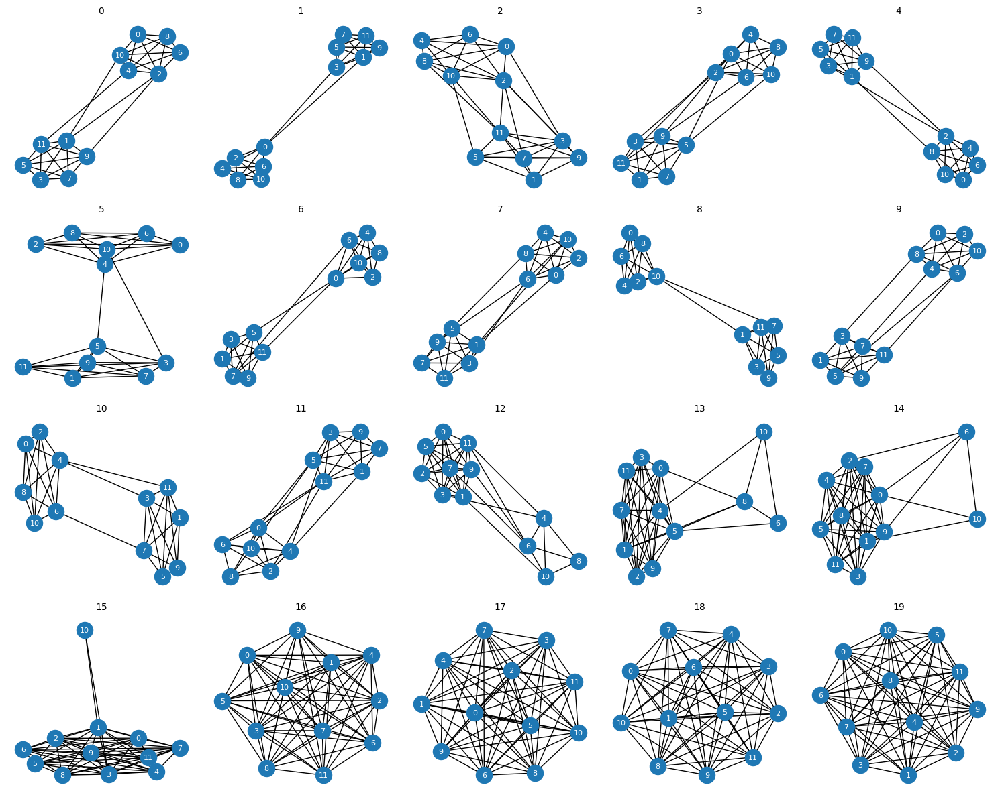

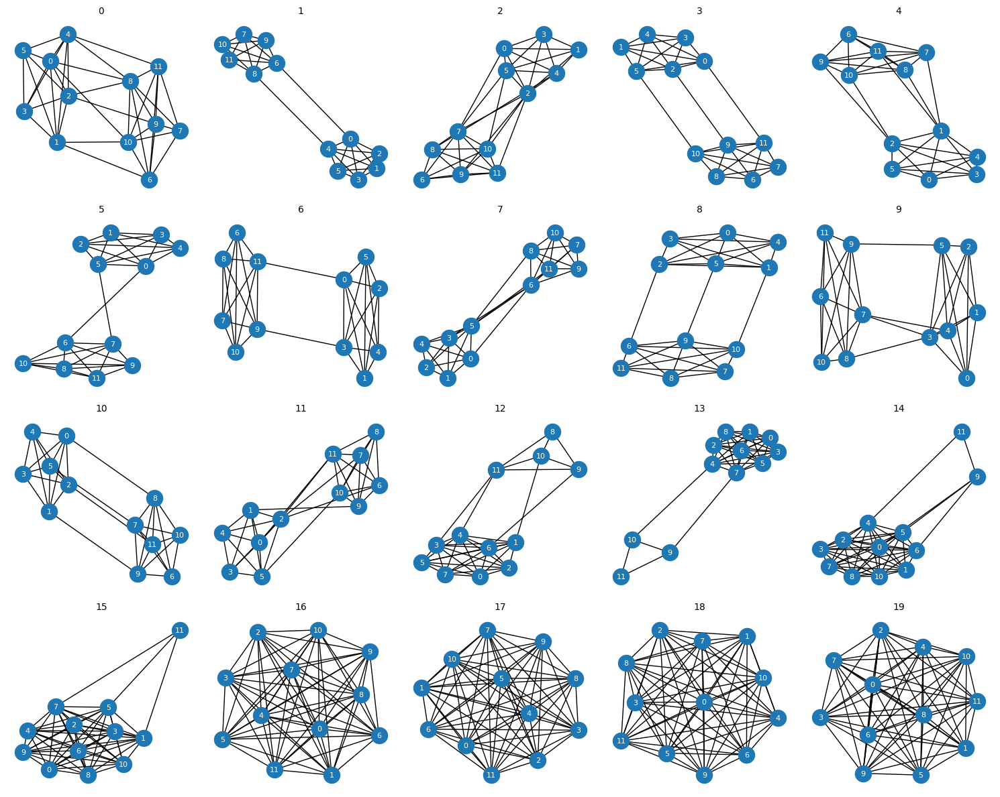

In [20]:
merge, gt, cl = generate_dynamic_graphs(
    num_nodes=12,
    num_steps=20,
    num_groups=2,
    merge_events={10: [(0, 1, 5)]})

#nrugs.draw_networkrug(merge, color_encoding="id3", labels=True, pixel_size=20)
visualization.visualize_graphs(merge)


merge2, gt, cl = dg.generate_split_merge_data(
    num_nodes=12,
    num_steps=20,
    initial_groups=2,
    merge_time=10,
    merge_duration=5,
    intra_community_strength=1,
    inter_community_strength=0.1
)
visualization.visualize_graphs(merge2)


for t in cl:
   print(f"Step {t}: {len(cl[t])} nodes changed — {cl[t]}")


num_artists 12
id_mapper: colormap created with turbo and 0 to 11
num_artists 12
id_mapper: colormap created with turbo and 0 to 11


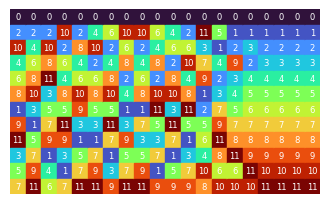

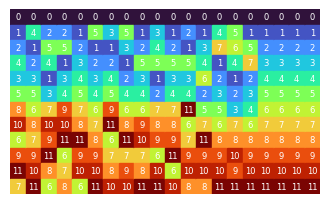

In [21]:
nrugs.draw_networkrug(merge, color_encoding="id3", labels=True, pixel_size=20)
nrugs.draw_networkrug(merge2, color_encoding="id3", labels=True, pixel_size=20)

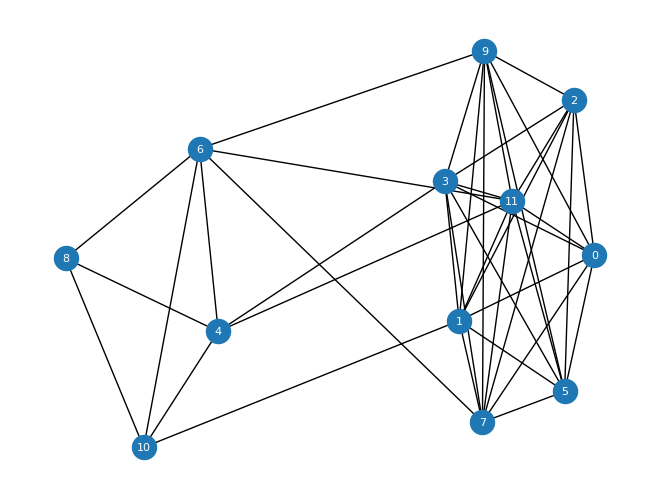

In [22]:
nx.draw(merge[12], with_labels=True, node_size=300, font_size=8, font_color='white')  

num_artists 30
min_centrality_all: 0.6082214765100671 max_centrality_all: 1.4264633546483032
id_mapper: colormap created with bwr and 0 to 29


<module 'matplotlib.pyplot' from '/Users/fri3d3rike/Desktop/Uni/thesis/.venv/lib/python3.13/site-packages/matplotlib/pyplot.py'>

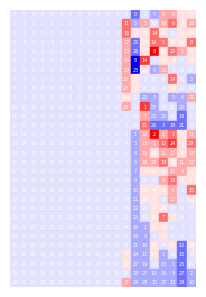

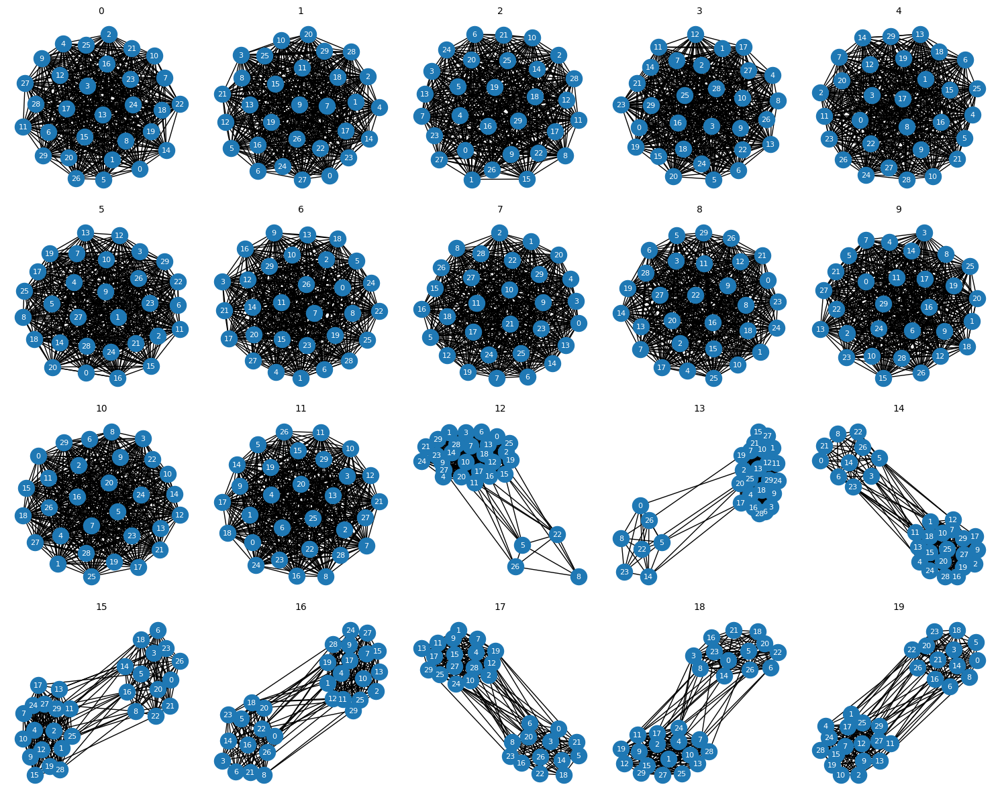

In [24]:
graphsXX, gt, cl = generate_dynamic_graphs(
    num_nodes=30,
    num_steps=20,
    num_groups=1,
    change_rate=0.00,
    intra_community_strength=1,
    inter_community_strength=0.1,
    split_events= {10: [(0, 5)] },
    seed=123
)
nrugs.draw_networkrug(graphsXX, color_encoding="closeness_centrality", colormap="bwr", labels=True, pixel_size=12)
visualization.visualize_graphs(graphsXX)

#### first a split and then a merge in one network

In [ ]:
test, gt, cl = dg.generate_dynamic_graphs(
    num_nodes=300,
    num_steps=550,
    initial_groups=1,
    change_rate=0,
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    split_events={50: [(0, 100)]},
    merge_events={250: [(0, 1, 250)]},
    #merge_events=None,
    split_fraction=0.5,
    merge_fraction=1.0,
    seed=42
)
#visualization.visualize_graphs(test)
nrugs.draw_networkrug(test, color_encoding="id3", labels=False, pixel_size=20)
#nrugs.draw_networkrug(test, color_encoding="closeness_centrality", labels=True, pixel_size=20)

In [ ]:
test, gt, cl = dg.generate_proportional_transition(
    num_nodes=300,
    num_steps=550,
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    initial_state={0: 100, 1:0},
    final_state={0: 50, 1:50},
    seed=42
)
nrugs.draw_networkrug(test, color_encoding="id3", labels=False, pixel_size=20)


In [ ]:
test, gt, cl = generate_dynamic_graphs(
    num_nodes=30,
    num_steps=80,
    num_groups=1,
    change_rate=0,
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    split_events={2: [(0,36)]},
    merge_events={44: [(0, 1, 30)]},
    #merge_events=None,
    split_fraction=0.5,
    merge_fraction=1.0,
    seed=42
)
visualization.visualize_graphs(test)
nrugs.draw_networkrug(test, color_encoding="closeness_centrality", labels=True, pixel_size=20)

In [ ]:
print(gt)
print()
print(cl)

#### Working on Development of Growth Generation Function

In [ ]:
import networkx as nx
import random
import math

def generate_proportional_transition(
    num_nodes=30,
    num_steps=10,
    initial_state=None,   # z.B. {0: 25, 1: 25, 2: 25, 3: 25} (Prozentwerte, Summe=100)
    final_state=None,     # z.B. {0: 10, 1: 50, 2: 20, 3: 20} 
    intra_community_strength=1.0,
    inter_community_strength=0.1,
    seed=42
):
    """
    Generate dynamic graphs in which the group proportions (as percentages) change
    from an initial state to a final state over a specified number of timesteps (snapshots).

    Input:
        num_nodes (int): Total number of nodes in the network.
        num_steps (int): Number of timesteps (snapshots).
        initial_state (dict): The initial state of the group distribution, e.g., {0: 25, 1: 25, 2: 25, 3: 25}
                            (percentage values, sum = 100).
        final_state (dict): The final state of the group distribution, e.g., {0: 10, 1: 50, 2: 20, 3: 20}.
        intra_community_strength (float): The probability for an edge within the same group.
        inter_community_strength (float): The probability for an edge between different groups.
        seed (int): Seed for the random number generator.

    Returns:
        graphs (dict): A mapping from timestep to a networkx Graph.
        ground_truth (dict): A mapping from timestep to {node: group_id}.
        change_log (dict): A mapping from timestep to a list of nodes that have changed group compared 
                        to the previous timestep.
    """
    random.seed(seed)
    nodes = list(range(num_nodes))
    
    # if not provided, set initial_state and final_state to default values
    if initial_state is None:
        initial_state = {0: 100}
    if final_state is None:
        final_state = initial_state.copy()
    
    # check percentages are valid (sum to 100)
    if abs(sum(initial_state.values()) - 100) > 1e-6 or abs(sum(final_state.values()) - 100) > 1e-6:
        raise ValueError("Initial and final state percentages must sum to 100.")
    
    groups = list(initial_state.keys())
    num_groups = len(groups)
    
    # calculate the number of nodes in each group at the start and end
    # convert percentages to counts
    def percentages_to_counts(state):
        counts = {g: (state[g] / 100) * num_nodes for g in state}
        rounded = {g: int(math.floor(counts[g])) for g in counts}
        remaining = num_nodes - sum(rounded.values())
        # distribution of remaining nodes to the groups with the largest difference between counts and rounded counts
        remainder_groups = sorted(state.keys(), key=lambda g: counts[g] - rounded[g], reverse=True)
        for g in remainder_groups:
            if remaining <= 0:
                break
            rounded[g] += 1
            remaining -= 1
        return rounded
    
    init_counts = percentages_to_counts(initial_state)
    final_counts = percentages_to_counts(final_state)
    
    # init first state: random assignment of nodes to groups
    all_nodes = nodes.copy()
    #random.shuffle(all_nodes) # shuffle the nodes for random assignment
    community_assignment = {}
    index = 0
    for g in sorted(init_counts.keys()):
        count = init_counts[g]   # number of nodes in group g
        for _ in range(count):
            community_assignment[all_nodes[index]] = g
            index += 1
    
    graphs = {}
    ground_truth = {}
    change_log = {}
    
    # gradual change from init_counts to final_counts for each timestep
    # desired node volume for group g at time t (linearly interpolated):
    def desired_count(g, t):
        return round(init_counts[g] + (final_counts[g] - init_counts[g]) * t / (num_steps - 1))
    
    for t in range(num_steps):
        desired = {g: desired_count(g, t) for g in init_counts}
        current = {}
        for g in init_counts:
            current[g] = sum(1 for n in community_assignment.values() if n == g)  # count nodes in group g
        
        # Calculate surplus (current > desired) and deficit (current < desired)
        # Surplus: groups from which nodes should be removed
        excess = {}  # {g: count of excess nodes in group g}, ..}
        #  Deficit: groups to which nodes should be added
        deficit = {}
        for g in init_counts:
            if current[g] > desired[g]:
                excess[g] = current[g] - desired[g]
            elif current[g] < desired[g]:
                deficit[g] = desired[g] - current[g]
        
        # If there are both deficits and surpluses, transfer nodes accordingly
        # randomly transfer nodes to groups with a deficit
        for g_excess in list(excess.keys()):  # g_excess: groups with excess nodes
            if excess[g_excess] <= 0:
                continue
            # list of nodes currently assigned to the surplus groups
            nodes_in_excess = [n for n, grp in community_assignment.items() if grp == g_excess]
            #random.shuffle(nodes_in_excess)
            for g_deficit in list(deficit.keys()):
                if deficit[g_deficit] <= 0:
                    continue
                # how many nodes can be transferred from g_excess to g_deficit
                # excess[g_excess]: number of extra nodes in surplus group g_excess
                # deficit[g_deficit]: number of missing nodes group g_deficit
                transfer = min(excess[g_excess], deficit[g_deficit])
                # move nodes
                for node in nodes_in_excess[:transfer]:
                    community_assignment[node] = g_deficit
                excess[g_excess] -= transfer
                deficit[g_deficit] -= transfer
                # update the list of nodes in the surplus group
                nodes_in_excess = nodes_in_excess[transfer:]
                if excess[g_excess] <= 0:
                    break

        G = nx.Graph()
        G.add_nodes_from(nodes)
        for i in range(num_nodes):
            for j in range(i+1, num_nodes):
                same_group = community_assignment[i] == community_assignment[j]
                p = intra_community_strength if same_group else inter_community_strength
                if random.random() < p:
                    G.add_edge(i, j, weight=1.0 if same_group else 0.3)
        
        # weak edges between communities for visualization
        community_nodes = {}
        for g in set(community_assignment.values()):
            community_nodes[g] = [node for node, grp in community_assignment.items() if grp == g]
        sorted_groups = sorted(community_nodes.keys())
        for idx in range(len(sorted_groups)-1):
            node_a = random.choice(community_nodes[sorted_groups[idx]])
            node_b = random.choice(community_nodes[sorted_groups[idx+1]])
            G.add_edge(node_a, node_b, weight=0.01)
        
        graphs[t] = G
        ground_truth[t] = community_assignment.copy()
        if t > 0:
            prev_state = ground_truth[t-1]
            changes = [n for n in nodes if community_assignment[n] != prev_state[n]]
            change_log[t] = changes
    
    return graphs, ground_truth, change_log

growth, gt, cl = generate_proportional_transition(
    num_nodes=10,
    num_steps=200,
    initial_state={0: 50, 1: 50},
    final_state= {0: 20, 1: 80} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)

#visualization.visualize_graphs(growth)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=20,
    num_steps=200,
    initial_state={0: 50, 1: 50},
    final_state= {0: 20, 1: 80} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)

In [ ]:
nrugs.draw_networkrug(growth, color_encoding="id3", labels=True, pixel_size=20)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=30,
    num_steps=20,
    initial_state={0: 50, 1: 50},
    final_state= {0: 20, 1: 80} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)

visualization.visualize_graphs(growth)
nrugs.draw_networkrug(growth, color_encoding="id3", labels=True, pixel_size=20)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=2000,
    num_steps=20,
    final_state={0: 50, 1: 50, 2:0},
    initial_state= {0: 10, 1: 80, 2:10} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
#visualization.visualize_graphs(growth)

In [ ]:
print(gt[1])

In [ ]:
nrugs.draw_networkrug(growth, color_encoding="id3", labels=False, pixel_size=20)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=200,
    num_steps=20,
    initial_state={0: 50, 1: 50, 2:0},
    final_state= {0: 10, 1: 80, 2:10} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(growth, color_encoding="id3", labels=False, pixel_size=20)
visualization.visualize_graphs(growth)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=200,
    num_steps=20,
    initial_state={0: 50, 1: 50, 2:0, 3:0},
    final_state= {0: 25, 1: 25, 2:25, 3:25},
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(growth, color_encoding="id3", labels=False, pixel_size=20)
visualization.visualize_graphs(growth)

In [ ]:
growth, gt, cl = generate_proportional_transition(
    num_nodes=200,
    num_steps=200,
    initial_state={0: 50, 1: 50, 2:0, 3:0},
    final_state= {0: 25, 1: 25, 2:25, 3:25},
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(growth, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(growth, color_encoding="id3", labels=False, pixel_size=20)
visualization.visualize_graphs(growth)

In [ ]:
nrugs.draw_networkrug(growth, color_encoding="id3", labels=False, pixel_size=20)


In [ ]:
split, gt, cl = dg.generate_proportional_transition(
    num_nodes=200,
    num_steps=20,
    initial_state={0: 50, 1: 50, 2:0},
    final_state= {0: 50, 1: 25, 2:25} ,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(split, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(split, color_encoding="id3", labels=False, pixel_size=20)
visualization.visualize_graphs(split)

In [ ]:
split2, gt, cl = dg.generate_split_merge_data(
    num_nodes=200,
    num_steps=20,
    initial_groups=1,
    split_time=2,
    split_duration=18,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(split2, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(split2, color_encoding="id3", labels=False, pixel_size=20)
visualization.visualize_graphs(split2)

In [ ]:
splitG, gt, cl = dg.generate_proportional_transition(
    num_nodes=200,
    num_steps=200,
    initial_state={0: 100, 1:0},
    final_state= {0: 50,1:50},
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(splitG, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(splitG, color_encoding="id3", labels=False, pixel_size=20)

splitD, gt, cl = dg.generate_split_merge_data(
    num_nodes=200,
    num_steps=200,
    initial_groups=1,
    split_time=2,
    split_duration=199,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(splitD, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(splitD, color_encoding="id3", labels=False, pixel_size=20)


In [ ]:
splitD, gt, cl = dg.generate_split_merge_data(
    num_nodes=200,
    num_steps=400,
    initial_groups=1,
    split_time=2,
    split_duration=50,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
#nrugs.draw_networkrug(splitD, color_encoding="closeness_centrality", labels=False, pixel_size=20)
#nrugs.draw_networkrug(splitD, color_encoding="id3", labels=False, pixel_size=20)

nrugs.interactive_rug(splitD)

In [ ]:
splitG, gt, cl = dg.generate_proportional_transition(
    num_nodes=200,
    num_steps=200,
    initial_state={0: 100, 1:0},
    final_state= {0: 50,1:50},
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(splitG, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(splitG, color_encoding="id3", labels=False, pixel_size=20)

splitD, gt, cl = dg.generate_split_merge_data(
    num_nodes=200,
    num_steps=200,
    initial_groups=1,
    split_time=2,
    split_duration=199,
    intra_community_strength=0.8,
    inter_community_strength=0.1
)
nrugs.draw_networkrug(splitD, color_encoding="closeness_centrality", labels=False, pixel_size=20)
nrugs.draw_networkrug(splitD, color_encoding="id3", labels=False, pixel_size=20)


#### Testing the color_encoding

In [ ]:
graphs, gt, changes = dg.generate_dynamic_graphs(
    num_nodes=120,
    num_steps= 30,
    initial_groups=2,
    change_rate=0,
    intra_community_strength=1,
    inter_community_strength=0.1,
    split_events= {10: [(0, 25)], 15: [(1, 15)]},
    #init_mode="random",
    init_mode="block",
    seed=42
)

# Create a static graph with nodes only
static_start_graph = nx.Graph()
static_start_graph.add_nodes_from(range(120))
initial_ordering = list(range(120))  # Simply 0, 1, 2, ..., 119
# Shift all other graphs forward in time
graphs_shifted = {t + 1: g for t, g in graphs.items()}
graphs_with_start = {0: static_start_graph}
graphs_with_start.update(graphs_shifted)

# Similarly update ground truth if needed
ordering_dict = orderings.get_priority_bfs_ordering(graphs)
ordering = {0: initial_ordering}
ordering.update({t + 1: ordering_dict[t] for t in ordering_dict})  # assuming ordering_dict exists

from ba_utils.visualization import draw_rug_from_graphs

draw_rug_from_graphs(graphs_data=graphs_with_start,
                     ordering=ordering,
                     color_encoding="id3",
                     labels=False,
                     pixel_size=5)

